# Equity trend following and macro headwinds

This notebook offers the necessary code to replicate the research findings discussed in the Macrosynergy research post entitled “Equity trend following and macro headwinds”. Its primary objective is to inspire readers to explore and conduct additional investigations whilst also providing a foundation for testing their own unique ideas.

## Get packages and JPMaQS data

This notebook primarily relies on the standard packages available in the Python data science stack. However, there is an additional package `macrosynergy` that is required for two purposes:

- Downloading JPMaQS data: The `macrosynergy` package facilitates the retrieval of JPMaQS data, which is used in the notebook.

- For the analysis of quantamental data and value propositions: The `macrosynergy` package provides functionality for performing quick analyses of quantamental data and exploring value propositions.

For detailed information and a comprehensive understanding of the `macrosynergy` package and its functionalities, please refer to the [“Introduction to Macrosynergy package”](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php) notebook on the Macrosynergy Quantamental Academy or visit the following link on [Kaggle](https://www.kaggle.com/code/macrosynergy/introduction-to-macrosynergy-package).

In [1]:
# Run only if needed!
# !pip install macrosynergy --upgrade

In [2]:
import numpy as np
import pandas as pd
from pandas import Timestamp
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
import os
from datetime import date

import macrosynergy.management as msm
import macrosynergy.panel as msp
import macrosynergy.signal as mss
import macrosynergy.pnl as msn
from macrosynergy.download import JPMaQSDownload

warnings.simplefilter("ignore")

In [3]:
# Equity cross-section lists

cids_g3 = ["EUR", "JPY", "USD"]  # DM large curency areas
cids_dmes = ["AUD", "CAD", "CHF", "GBP", "SEK"]  # Smaller DM equity countries
cids_dmeq = cids_g3 + cids_dmes  # DM equity countries
cids = cids_dmeq  # default for data import, at present only equity analysis

JPMaQS indicators are conveniently grouped into 6 main categories: Economic Trends, Macroeconomic balance sheets, Financial conditions, Shocks and risk measures, Stylized trading factors, and Generic returns. Each indicator has a separate page with notes, description, availability, statistical measures, and timelines for main currencies. The description of each JPMaQS category is available either under [JPMorgan Markets](https://markets.jpmorgan.com/#jpmaqs) (password protected) or the [Macro Quantamental Academy](https://academy.macrosynergy.com/quantamental-indicators/). In particular, the indicators used in this notebook can be found under [Labor market dynamics](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Labor%20market%20dynamics.php), [Labor market tightness](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Labor%20market%20tightness.php), [Wage growth](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Wage%20growth.php?highlight=wages_nsa), [Consumer price inflation trends](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Consumer%20price%20inflation%20trends.php), [Equity index future carry](https://academy.macrosynergy.com/academy/Themes/Stylized%20trading%20factors/_build/html/notebooks/Equity%20index%20future%20carry.php?highlight=eqcrr_nsa), [Global production shares](https://academy.macrosynergy.com/academy/Themes/Macroeconomic%20balance%20sheets/_build/html/notebooks/Shares%20in%20global%20production.php?highlight=usdgdpwgt), [Intuitive growth estimates](https://macrosynergy.com/academy/notebooks/intuitive-gdp-growth-estimates/), and [Equity index future returns](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/Equity%20index%20future%20returns.php).

In [4]:
# Category tickers

main = [
    "EMPL_NSA_P1M1ML12_3MMA",
    "EMPL_NSA_P1Q1QL4",
    "WFORCE_NSA_P1Y1YL1_5YMM",
    "UNEMPLRATE_NSA_3MMA_D1M1ML12",
    "UNEMPLRATE_NSA_D1Q1QL4",
    "UNEMPLRATE_SA_D3M3ML3",
    "UNEMPLRATE_SA_D1Q1QL1",
    "UNEMPLRATE_SA_3MMA",
    "UNEMPLRATE_SA_3MMAv5YMM",
    "UNEMPLRATE_SA_3MMAv10YMM",
    "WAGES_NSA_P1M1ML12_3MMA",
    "WAGES_NSA_P1Q1QL4",
    "CPIH_SA_P1M1ML12",
    "CPIH_SJA_P6M6ML6AR",
    "CPIC_SA_P1M1ML12",
    "CPIC_SJA_P6M6ML6AR",
    "EQCRR_VT10",
    "EQCRR_NSA",
]

xtra = [
    "RGDP_SA_P1Q1QL4_20QMM",
    "USDGDPWGT_SA_3YMA",
    "INFTEFF_NSA",
    "INFTARGET_NSA",
]

rets = [
    "EQXR_NSA",
    "EQXR_VT10",
]

xcats = main + rets + xtra

# Resultant tickers

tickers = [cid + "_" + xcat for cid in cids for xcat in xcats]
print(f"Maximum number of tickers is {len(tickers)}")

Maximum number of tickers is 192


In [5]:
client_id: str = os.getenv("DQ_CLIENT_ID")
client_secret: str = os.getenv("DQ_CLIENT_SECRET")

with JPMaQSDownload(oauth=True, client_id=client_id, client_secret=client_secret) as dq:
    assert dq.check_connection()
    df = dq.download(
        tickers=tickers,
        start_date="1990-01-01",
        suppress_warning=True,
        metrics=["value"],
        show_progress=True,
    )
    assert isinstance(df, pd.DataFrame) and not df.empty

print("Last updated:", date.today())

Timestamp UTC:  2025-03-05 15:52:57
Connection successful!


Requesting data: 100%|██████████| 10/10 [00:02<00:00,  4.95it/s]


Some expressions are missing from the downloaded data. Check logger output for complete list.
32 out of 192 expressions are missing. To download the catalogue of all available expressions and filter the unavailable expressions, set `get_catalogue=True` in the call to `JPMaQSDownload.download()`.
Some dates are missing from the downloaded data. 
2 out of 9180 dates are missing.
Last updated: 2025-03-05


In [6]:
dfx = df.copy().sort_values(["cid", "xcat", "real_date"])
dfx.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1235154 entries, 108856 to 1218870
Data columns (total 4 columns):
 #   Column     Non-Null Count    Dtype         
---  ------     --------------    -----         
 0   real_date  1235154 non-null  datetime64[ns]
 1   cid        1235154 non-null  object        
 2   xcat       1235154 non-null  object        
 3   value      1235154 non-null  float64       
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 47.1+ MB


# Availability and renaming

Rename quarterly tickers to roughly equivalent monthly tickers to simplify subsequent operations.

In [7]:
dict_repl = {
    "EMPL_NSA_P1Q1QL4": "EMPL_NSA_P1M1ML12_3MMA",
    "WFORCE_NSA_P1Q1QL4_20QMM": "WFORCE_NSA_P1Y1YL1_5YMM",
    "UNEMPLRATE_NSA_D1Q1QL4": "UNEMPLRATE_NSA_3MMA_D1M1ML12",
    "WAGES_NSA_P1Q1QL4": "WAGES_NSA_P1M1ML12_3MMA",
    "UNEMPLRATE_SA_D1Q1QL1": "UNEMPLRATE_SA_D3M3ML3",
}

for key, value in dict_repl.items():
    dfx["xcat"] = dfx["xcat"].str.replace(key, value)

It is important to assess data availability before conducting any analysis. It allows to identify any potential gaps or limitations in the dataset, which can impact the validity and reliability of analysis and ensure that a sufficient number of observations for each selected category and cross-section is available as well as determining the appropriate time periods for analysis.

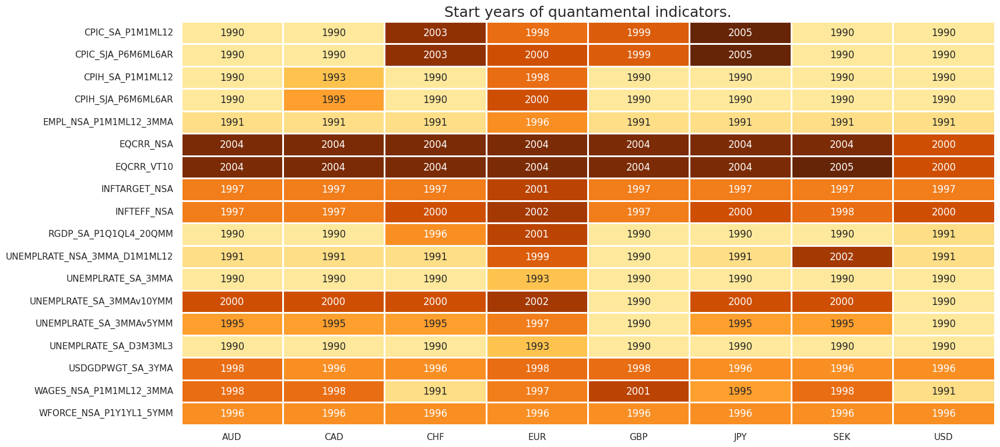

In [8]:
msm.check_availability(dfx, xcats=main + xtra, cids=cids, missing_recent=False)

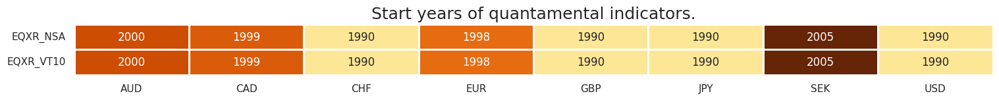

In [9]:
msm.check_availability(dfx, xcats=rets, cids=cids, missing_recent=False)

# Transformations and checks

## Features

### Labor market

#### Excess wage growth

Excess wage growth here is defined as wage growth per unit of output in excess of the effective estimated inflation target. Excess wage growth refers to the increase in wages relative to the growth in productivity or output, beyond what is considered consistent with the targeted level of inflation. It indicates a situation where wages are rising at a faster pace than can be justified by the prevailing inflation rate and the overall increase in economic output. Excess wage growth can contribute to inflationary pressures in the economy.

In [10]:
cidx = cids_dmeq

calcs = [
    "LPGT = RGDP_SA_P1Q1QL4_20QMM - WFORCE_NSA_P1Y1YL1_5YMM ",  # labor productivity growth trend
    "XWAGES_NSA_P1M1ML12_3MMA = WAGES_NSA_P1M1ML12_3MMA - LPGT - INFTEFF_NSA ",  # expected nominal GDP growth
]
dfa = msp.panel_calculator(
    dfx,
    calcs=calcs,
    cids=cids,
)
dfx = msm.update_df(dfx, dfa)

The macrosynergy package provides two useful functions, `view_ranges()` and `view_timelines()`, which facilitate the convenient visualization of data for selected indicators and cross-sections. These functions assist in plotting means, standard deviations, and time series of the chosen indicators.



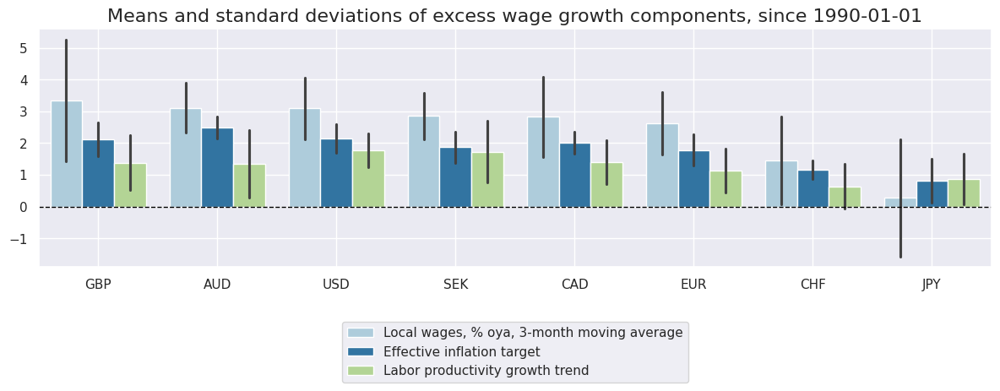

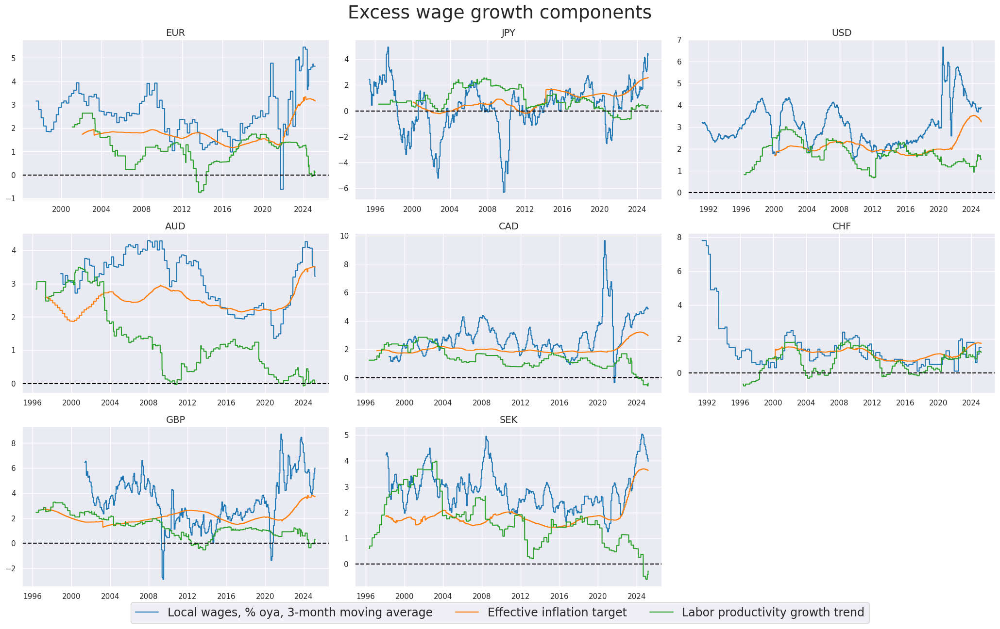

In [11]:
xcatx = ["WAGES_NSA_P1M1ML12_3MMA", "INFTEFF_NSA", "LPGT"]
cidx = cids_dmeq
sdate = "1990-01-01"

msp.view_ranges(
    dfx,
    cids=cidx,
    xcats=xcatx,
    kind="bar",
    sort_cids_by="mean",
    title=f"Means and standard deviations of excess wage growth components, since {sdate}",
    xcat_labels=[
        "Local wages, % oya, 3-month moving average",
        "Effective inflation target",
        "Labor productivity growth trend",
    ],
    size=(12, 5),
    start=sdate,
)
msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    cumsum=False,
    start=sdate,
    title="Excess wage growth components",
    xcat_labels=[
        "Local wages, % oya, 3-month moving average",
        "Effective inflation target",
        "Labor productivity growth trend",
    ],
    legend_fontsize=17,
    same_y=False,
    all_xticks=True,
    title_fontsize=27,
   )

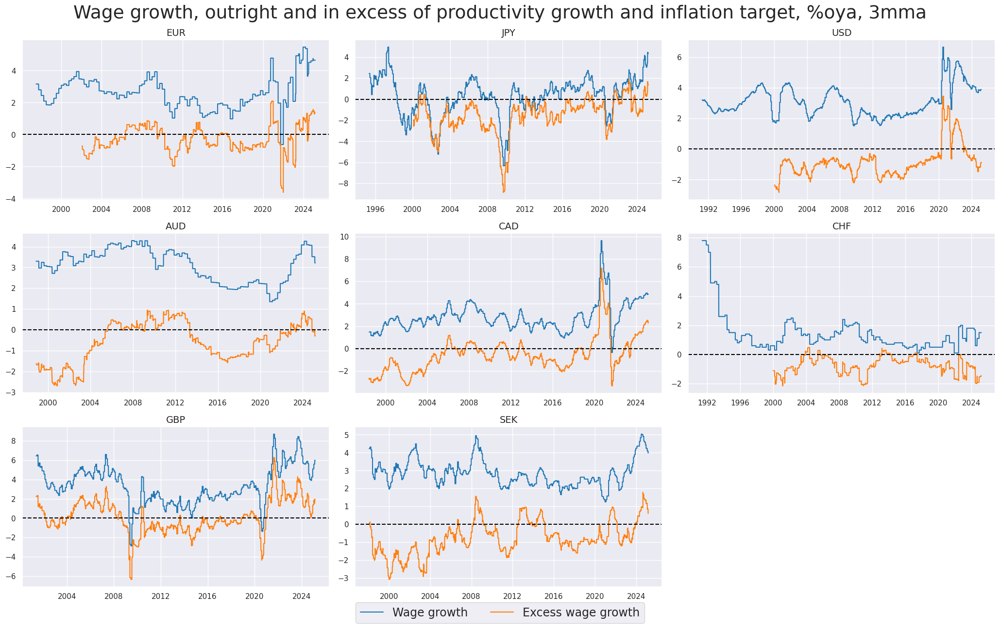

In [12]:
xcatx = [
    "WAGES_NSA_P1M1ML12_3MMA",
    "XWAGES_NSA_P1M1ML12_3MMA",
]
cidx = cids_dmeq
sdate = "1990-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Wage growth, outright and in excess of productivity growth and inflation target, %oya, 3mma",
    title_fontsize=27,
    legend_fontsize=17,
    xcat_labels=["Wage growth", "Excess wage growth"],
)

####  Excess employment growth

To proxy the impact of the business cycle state on employment growth, a common approach is to calculate the difference between employment growth and the long-term median of workforce growth. This difference is often referred to as “excess employment growth.” By calculating excess employment growth, one can estimate the component of employment growth that is attributable to the business cycle state. This measure helps to identify deviations from the long-term trend and provides insights into the cyclical nature of employment dynamics.

In [13]:
calcs = ["XEMPL_NSA_P1M1ML12_3MMA = EMPL_NSA_P1M1ML12_3MMA - WFORCE_NSA_P1Y1YL1_5YMM "]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids, blacklist=None)
dfx = msm.update_df(dfx, dfa)

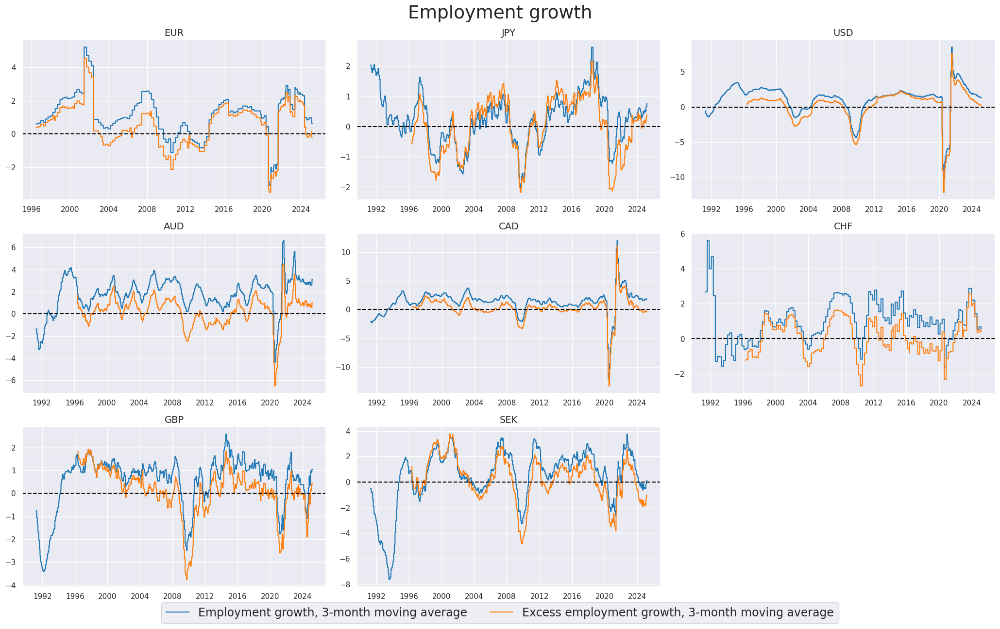

In [14]:
xcatx = [
    "EMPL_NSA_P1M1ML12_3MMA",
    "XEMPL_NSA_P1M1ML12_3MMA",
]
cidx = cids_dmeq
sdate = "1990-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    legend_fontsize=17,
    title="Employment growth",
    title_fontsize=27,
    xcat_labels=[
        "Employment growth, 3-month moving average",
        "Excess employment growth, 3-month moving average",
    ],
)

#### Excess unemployment rate

Here we take readily available [unemployment gaps](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Labor%20market%20tightness.php) indicators, showing unemployment rate, seasonally adjusted: 3-month moving average minus the 5-year/10-year moving average

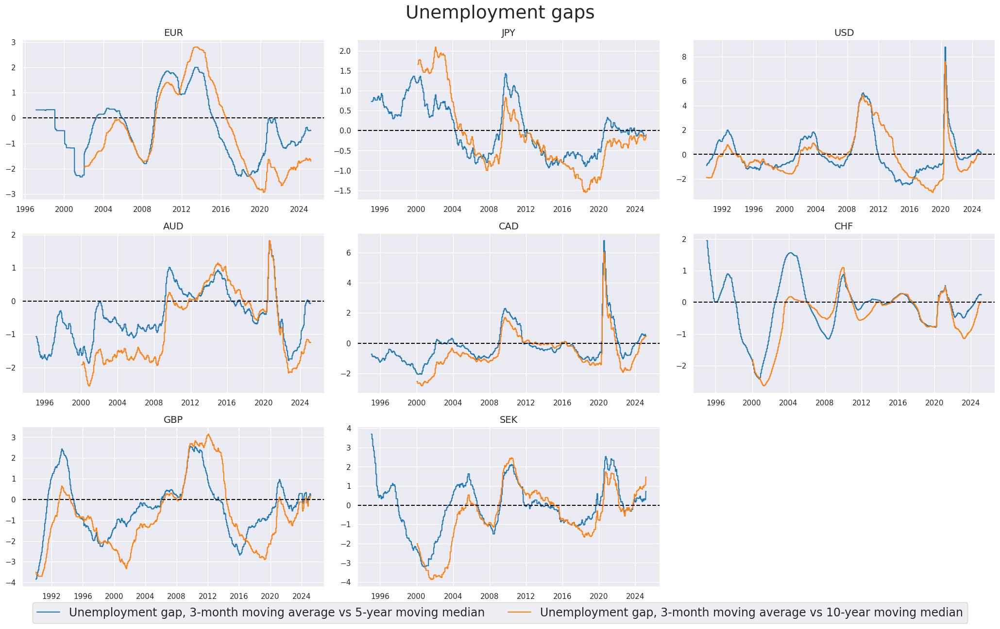

In [15]:
xcatx = [
    "UNEMPLRATE_SA_3MMAv5YMM",
    "UNEMPLRATE_SA_3MMAv10YMM",
]
cidx = cids_dmeq
sdate = "1990-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    legend_fontsize=17,
    title="Unemployment gaps",
    title_fontsize=27,
    xcat_labels=[
        "Unemployment gap, 3-month moving average vs 5-year moving median",
        "Unemployment gap, 3-month moving average vs 10-year moving median",
    ],
)

#### Composite labor tightness scores (DM)

We calculate composite zn-scores of Excess employment growth, Excess wage growth, and Unemployment gap with the function `make_zn_scores()`.  We set the cutoff value (threshold) for winsorization at 2 standard deviations. 

In [16]:
calcs = [
    "XEMPL_TREND_NEG = - XEMPL_NSA_P1M1ML12_3MMA ",
    "XWAGES_TREND_NEG = - XWAGES_NSA_P1M1ML12_3MMA ",
    "XURATE_3Mv5Y = UNEMPLRATE_SA_3MMAv5YMM ",
]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids, blacklist=None)
dfx = msm.update_df(dfx, dfa)

labs = [
    "XEMPL_TREND_NEG",
    "XWAGES_TREND_NEG",
    "XURATE_3Mv5Y",
]

xcatx = labs
cidx = cids_dmeq

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=0.5,  # variance estimated based on panel and cross-sectional variation
        thresh=2,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)
labz = [x + "_ZN" for x in labs]

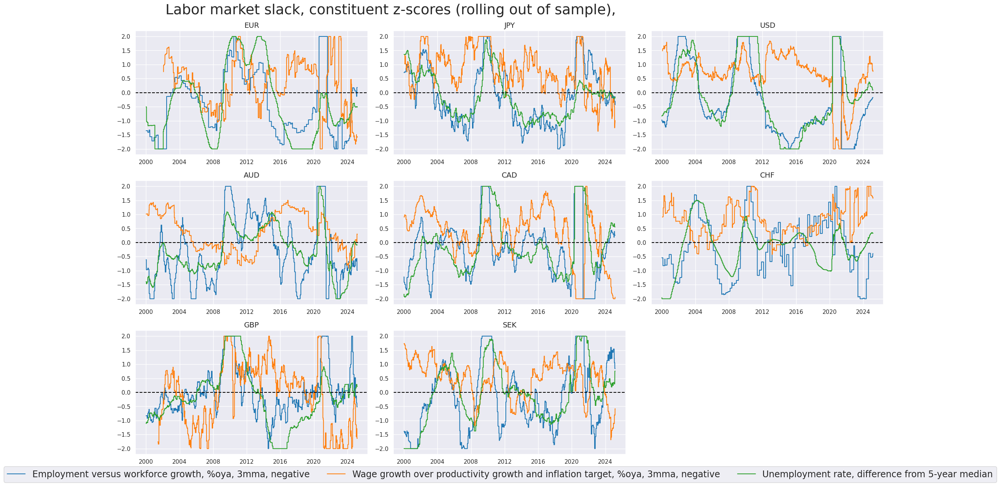

In [17]:
xcatx = labz
cidx = cids_dmeq
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Labor market slack, constituent z-scores (rolling out of sample),                                                 ",
    title_fontsize=27,
    xcat_labels=[
        "Employment versus workforce growth, %oya, 3mma, negative",
        "Wage growth over productivity growth and inflation target, %oya, 3mma, negative",
        "Unemployment rate, difference from 5-year median",
    ],
    legend_fontsize=17,
   
)

The individual category scores are combined into a single labor market tightness score using `linear_composite()` method from the `macrosynergy` package. The method allows for the specification of weights for each category, and the weights can be time-varying. Here we use equal weights for all categories.

In [18]:
xcatx = labz
cidx = cids_dmeq

dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    new_xcat="LABSLACK_CZS",
)

dfx = msm.update_df(dfx, dfa)

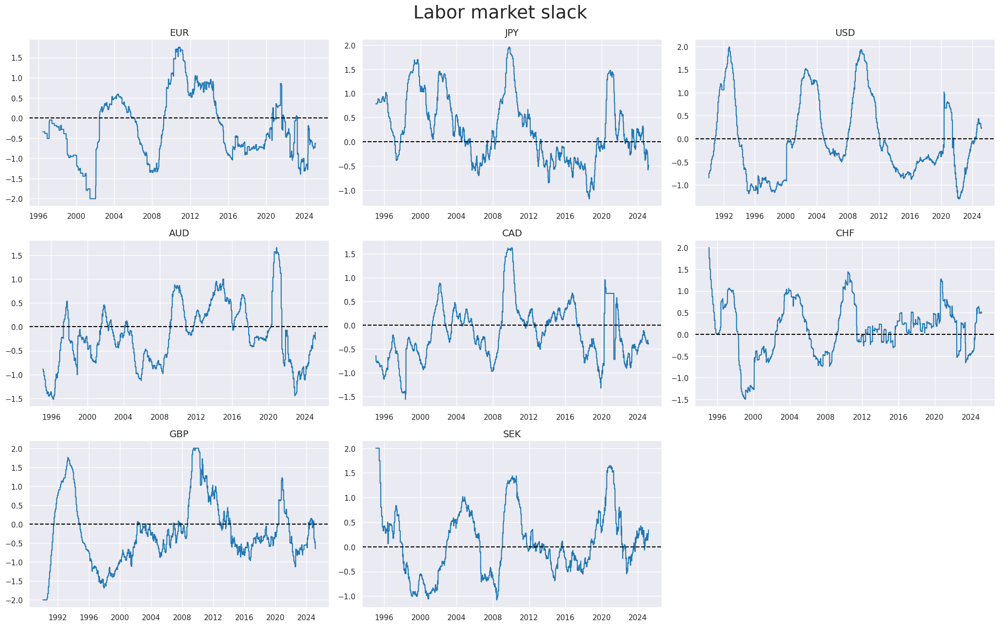

In [19]:
xcatx = ["LABSLACK_CZS"]
cidx = cids_dmeq
sdate = "1990-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Labor market slack",
    title_fontsize=27,
)

### Inflation

#### Inflation shortfall

Focus on core inflation, backfilled with headline inflation countries that do not provide core inflation back to 1990. CPIH indicators (headline consumer price inflation) for selected currencies usually have a longer history than CPIC (annual core consumer price inflation, preferred by the central bank or market), so we are using CPIC if available and backfill the series with CPIH data otherwise. 

In [20]:
dfa = pd.DataFrame(columns=list(dfx.columns))
chgs = ["SA_P1M1ML12", "SJA_P6M6ML6AR"]

for chg in chgs:
    dfaa = msp.linear_composite(
        dfx,
        xcats=[f"CPIC_{chg}", f"CPIH_{chg}"],
        cids=cids_dmeq,
        weights=[
            0.999,
            0.001,
        ],  # de-facto only uses CPIH when CPIC is missing, otherwise uses CPIC
        complete_xcats=False,
        new_xcat=f"CPICH_{chg}",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

Here we display the core inflation relative to the estimated extended official target for next year, % over a year ago.

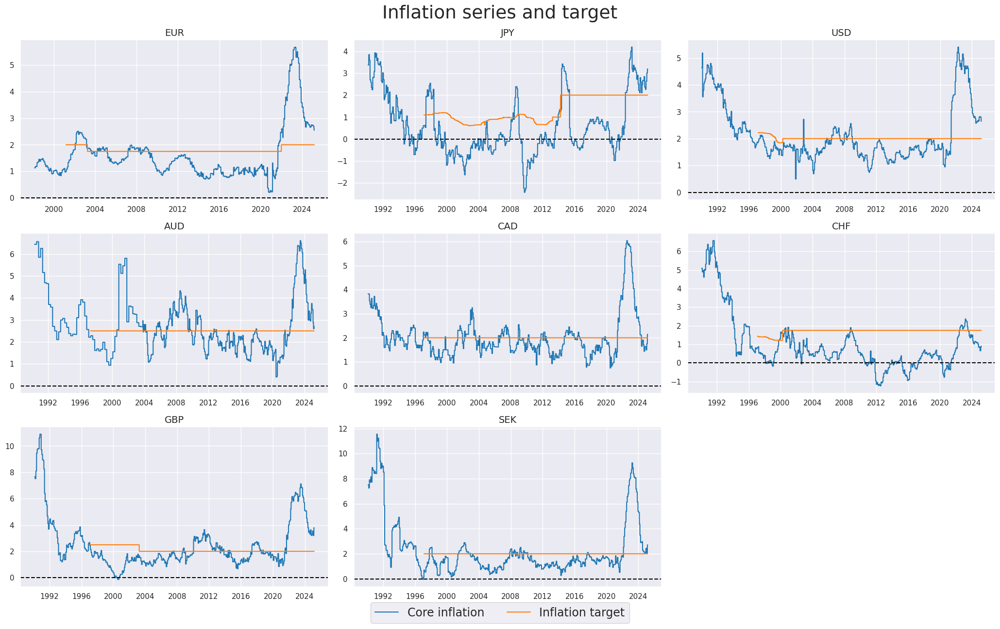

In [21]:
xcatx = [
    "CPICH_SA_P1M1ML12",
    "INFTARGET_NSA",
]
cidx = cids_dmeq
sdate = "1990-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    legend_fontsize=17,
    title="Inflation series and target",
    title_fontsize=27,
    xcat_labels=["Core inflation", "Inflation target"],
)

We create here two new categories `XCPICH_SA_P1M1ML12_SFALL` and `XCPICH_SJA_P6M6ML6AR_SFALL`, which are effectively the difference between the official target and the inflation rate (mostly core inflation, as described in the cell above) 

In [22]:
chgs = ["SA_P1M1ML12", "SJA_P6M6ML6AR"]

calcs = [f"XCPICH_{chg}_SFALL = - CPICH_{chg} + INFTARGET_NSA " for chg in chgs]

dfa = msp.panel_calculator(
    dfx,
    calcs=calcs,
    cids=cids,
)
dfx = msm.update_df(dfx, dfa)

xinfs = ["XCPICH_SA_P1M1ML12_SFALL", "XCPICH_SJA_P6M6ML6AR_SFALL"]

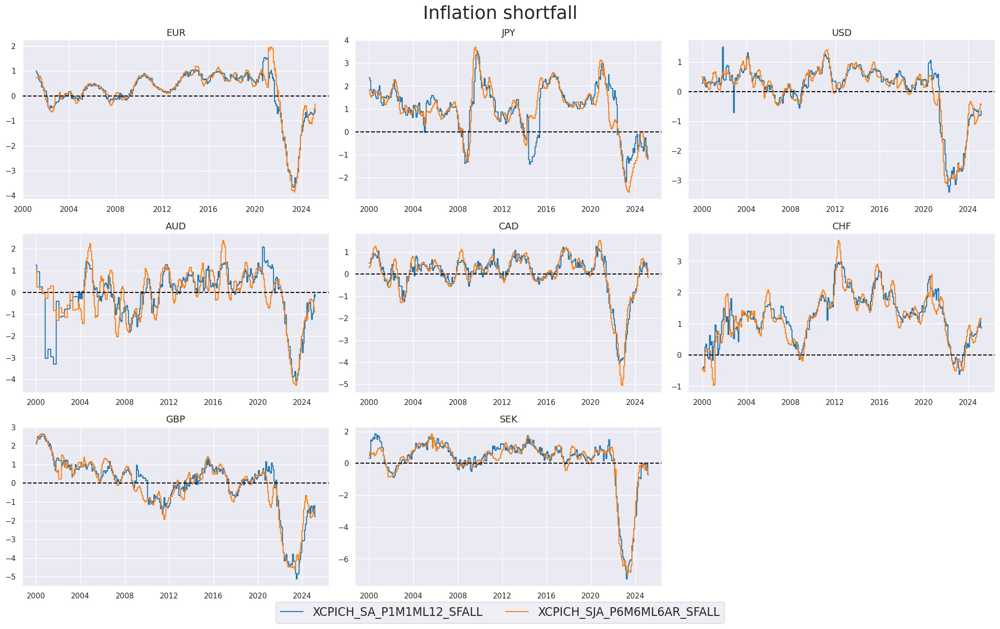

In [23]:
xcatx = xinfs
cidx = cids_dmeq
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    cumsum=False,
    start=sdate,
    same_y=False,
    title="Inflation shortfall",
    title_fontsize=27,
    all_xticks=True,
    legend_fontsize=17,
   
)

#### Excess inflation  scores

As before, for labor market indicators, we normalize values for the composite excess inflation metric around zero based on the average of the whole panel and corresponding cross-section (pan_weight=0.5), using `make_zn_scores()`, and then create an average of the two excess inflation scores using `linear_composite()`. More information on the `make_zn_scores()` and `linear_composite()` functions can be found in the [Introduction to Macrosynergy package](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php) notebook.

In [24]:
cidx = cids_dmeq
sdate = "1990-01-01"

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xinfs:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=0.5,  # variance estimated based on panel and cross-sectional variation
        thresh=2,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)


xinfz = [x + "_ZN" for x in xinfs]
comp_xinfz = ["XCPI_SFALL_CZS"]

dfaa = msp.linear_composite(
    df=dfa,
    xcats=xinfz,
    cids=cidx,
    complete_xcats=False,
    new_xcat=comp_xinfz[0],
)
dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

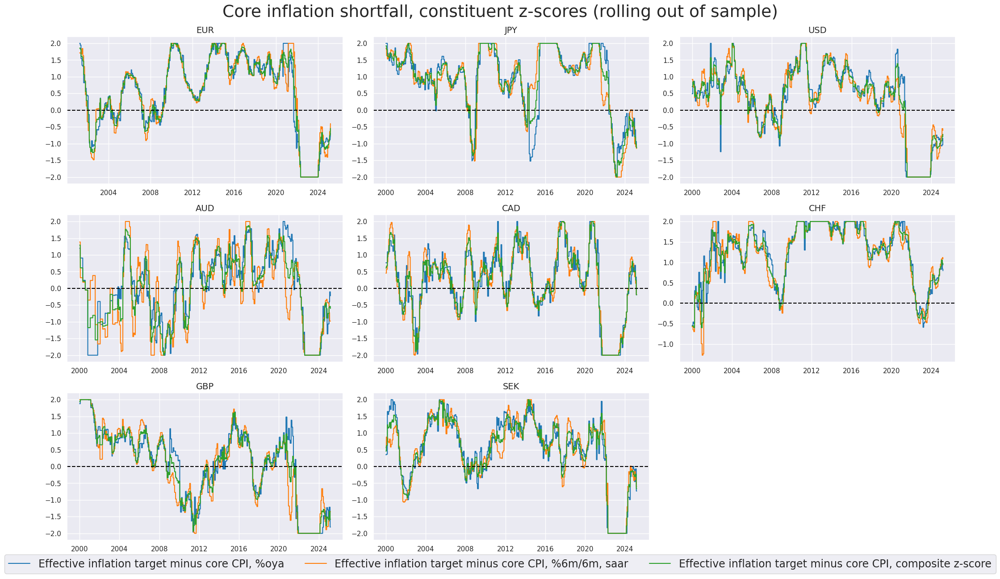

In [25]:
xcatx = xinfz + comp_xinfz
cidx = cids_dmeq
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Core inflation shortfall, constituent z-scores (rolling out of sample)",
    title_fontsize=27,
    xcat_labels=[
        "Effective inflation target minus core CPI, %oya",
        "Effective inflation target minus core CPI, %6m/6m, saar",
        "Effective inflation target minus core CPI, composite z-score",
    ],
    legend_fontsize=17,
 )

### Equity carry

#### Excess real carry

"Excess real equity carry" refers to a measure of the potential returns from holding a country's main equity index, adjusted for inflation and interest rates. The "neutral level" for the excess real equity carry is set based on a carry-to-volatility ratio ("Carry Sharpe") of 0.3. In other words, a real carry is considered attractive if the resulting Sharpe ratio from the carry return alone is at least 0.3. The Sharpe ratio is a measure of risk-adjusted returns, indicating the excess return per unit of risk.

In [26]:
# Based on minimum carry Sharpe of approximately 0.3

calcs = [
    "XEQCRR_NSA = EQCRR_NSA - 4",
    "XEQCRR_VT10 = EQCRR_VT10 - 3",
]
dfa = msp.panel_calculator(
    dfx,
    calcs=calcs,
    cids=cids,
)
dfx = msm.update_df(dfx, dfa)

xcrs = dfa["xcat"].unique().tolist()

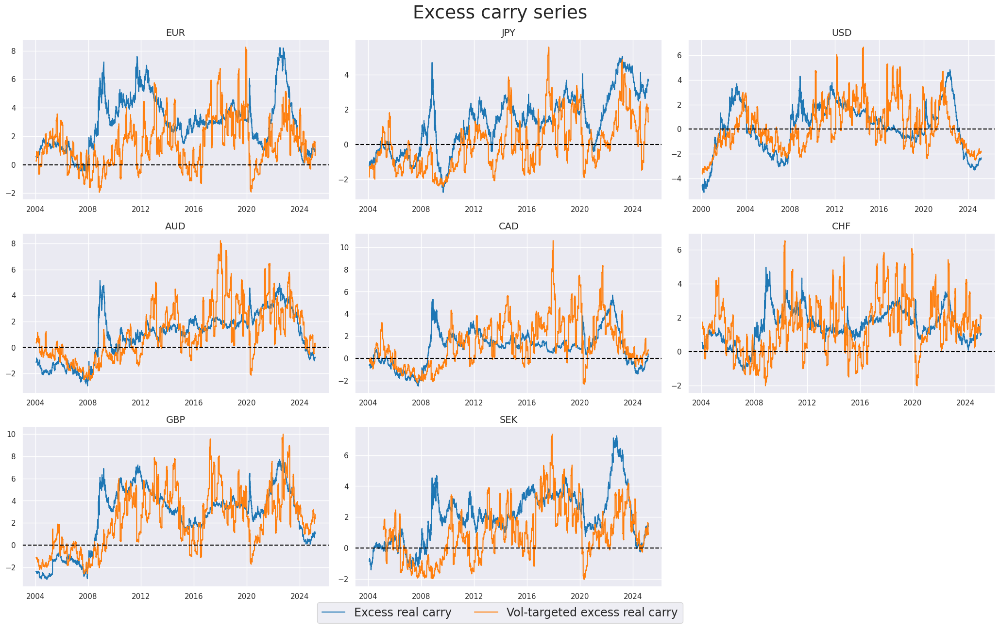

In [27]:
xcatx = xcrs
cidx = cids_dmeq
sdate = "1990-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    legend_fontsize=17,
    title="Excess carry series",
    title_fontsize=27,
    xcat_labels=["Excess real carry", "Vol-targeted excess real carry"],
)

#### Carry scores

As before, we normalize the excess real equity carry using `make_zn_scores()` and create a simple average of z-scored `XEQCRR_NSA` and `XEQCRR_VT10`.

In [28]:
cidx = cids_dmeq
sdate = "1990-01-01"

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcrs:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=0.5,  # variance estimated based on panel and cross-sectional variation
        thresh=2,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

xcrz = [x + "_ZN" for x in xcrs]

dfaa = msp.linear_composite(
    df=dfa,
    xcats=xcrz,
    cids=cidx,
    complete_xcats=False,
    new_xcat="XEQCRR_CZS",
)
dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

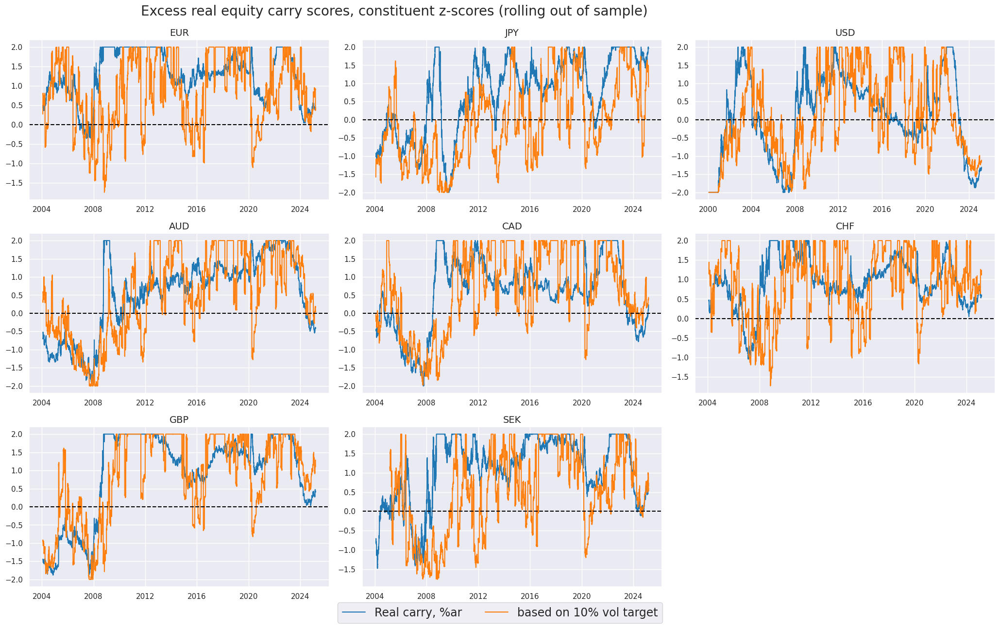

In [29]:
xcatx = xcrz
cidx = cids_dmeq
sdate = "1990-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Excess real equity carry scores, constituent z-scores (rolling out of sample)                                                 ",
    title_fontsize=20,
    xcat_labels=[
        "Real carry, %ar",
        "based on 10% vol target",
    ],
    legend_fontsize=17,
)

### Composite macro scores

We re-score all three composites - Labor market slack, Inflation shortfall, and Excess real equity carry to equalize standard deviations (and still using 2 standard deviations as threshhold).

In [30]:
cidx = cids_dmeq
comps = ["LABSLACK_CZS", "XCPI_SFALL_CZS", "XEQCRR_CZS"]

dfa = pd.DataFrame(columns=list(dfx.columns))
for cp in comps:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=cp,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=2,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

compz = [x + "_ZN" for x in comps]

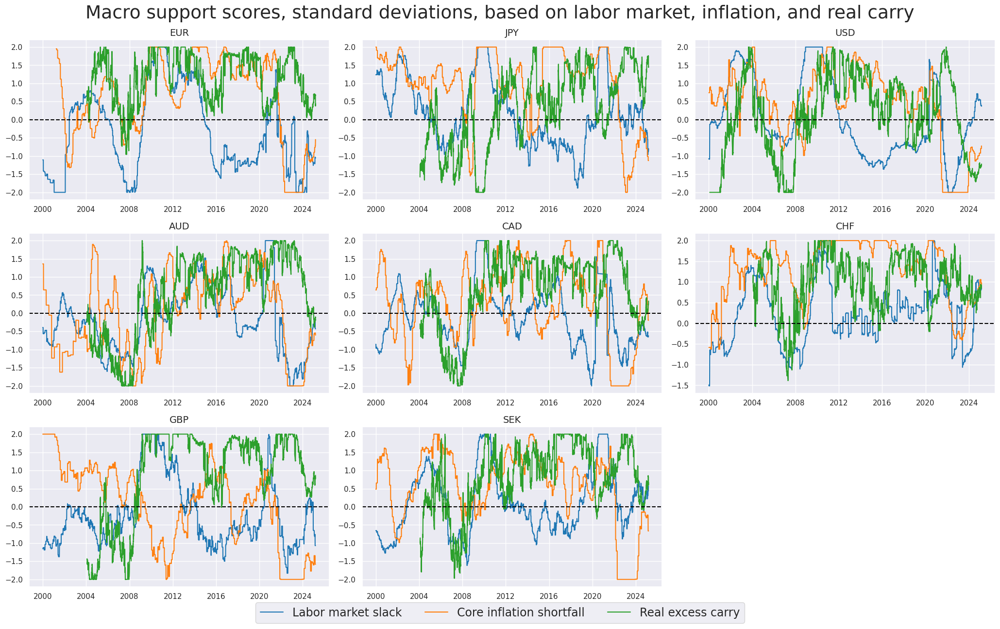

In [31]:
xcatx = compz
cidx = cids_dmeq
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Macro support scores, standard deviations, based on labor market, inflation, and real carry",
    title_fontsize=27,
    xcat_labels=["Labor market slack", "Core inflation shortfall", "Real excess carry"],
    legend_fontsize=17,
  
)

#### Cross-category scores

Here we create cross-category macro composite measures, based on the three constituent categories (labor market slack, inflation shortfall, and excess real equity carry). Since equity carry based on reliable sets of earnings and dividend predictions for the equity index is only available from 2004 for most countries, prior to 2004 we look at the macro composite measure, based on only two constituent categories (labor market slack and inflation shortfall)

In [32]:
cidx = cids_dmeq

# Use core inflation as countries are DM only

dict_mcz = {
    "MACRO_CZS_ALL": {
        "xcats": ["LABSLACK_CZS_ZN", "XCPI_SFALL_CZS_ZN", "XEQCRR_CZS_ZN"],
        "weights": [1, 1, 1],
    },
    "MACRO_CZS_XCRY": {
        "xcats": ["LABSLACK_CZS_ZN", "XCPI_SFALL_CZS_ZN"],
        "weights": [1, 1],
    },
}

dfa = pd.DataFrame(columns=list(dfx.columns))
for k, v in dict_mcz.items():
    dfaa = msp.linear_composite(
        df=dfx,
        xcats=v["xcats"],
        cids=cidx,
        complete_xcats=False,
        new_xcat=k,
        weights=v["weights"],
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

macro_czs = list(dict_mcz.keys())

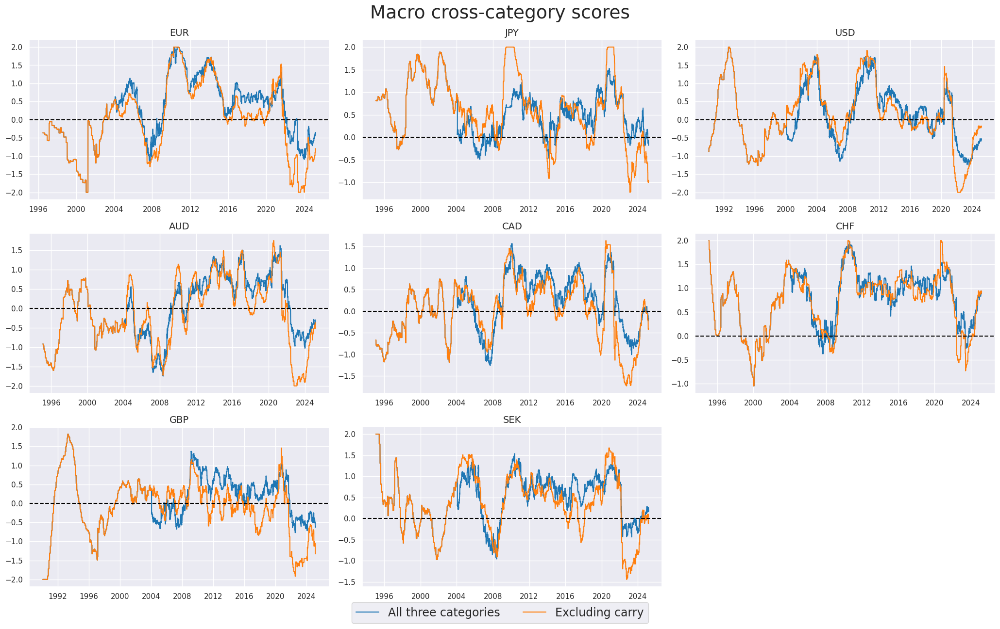

In [33]:
xcatx = ["MACRO_CZS_ALL", "MACRO_CZS_XCRY"]
cidx = cids_dmeq
sdate = "1990-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Macro cross-category scores",
    xcat_labels=["All three categories", "Excluding carry"],
    legend_fontsize=17,
    title_fontsize=27,
 
)

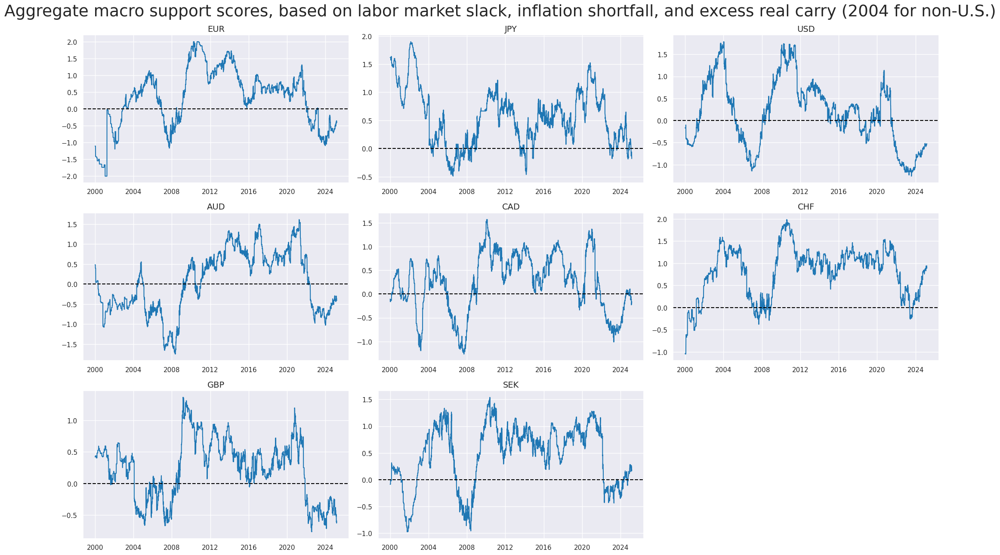

In [34]:
xcatx = ["MACRO_CZS_ALL"]
cidx = cids_dmeq
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Aggregate macro support scores, based on labor market slack, inflation shortfall, and excess real carry (2004 for non-U.S.)",
    title_fontsize=27,
)

### Weighted global scores

We create a composite of the macro support scores, using as weights the respective [share in world GDP (USD terms)](https://academy.macrosynergy.com/academy/Themes/Macroeconomic%20balance%20sheets/_build/html/notebooks/Shares%20in%20global%20production.php?highlight=usdgdpwgt). The `linear_composite()` function creates a new cross-section with postfix `GLB` for "global"

In [35]:
xcatx = macro_czs
cidx = cids_dmeq

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.linear_composite(
        df=dfx,
        xcats=xc,
        cids=cidx,
        complete_xcats=False,
        weights="USDGDPWGT_SA_3YMA",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

... and display the global macro scores on a timeline

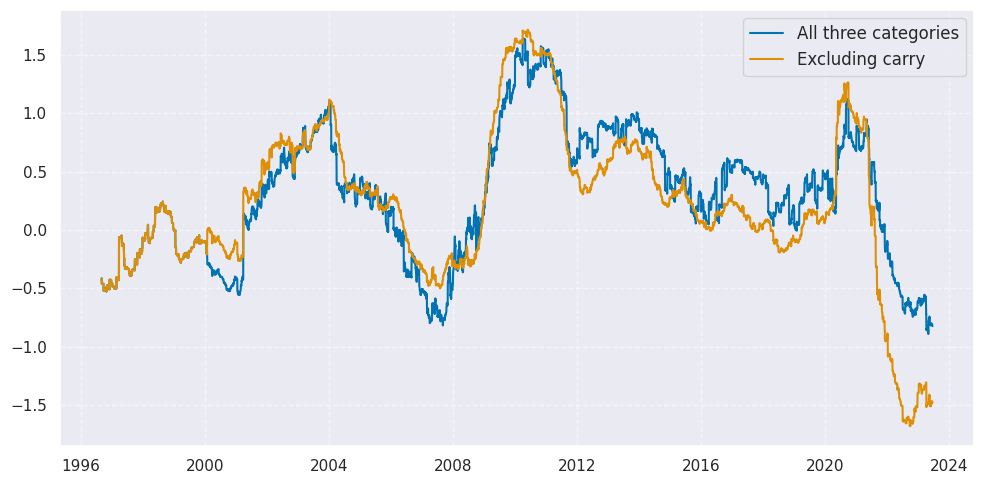

In [36]:
xcatx = macro_czs
cidx = ["GLB"]
sdate = "1990-01-01"


msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start=sdate,
    end="2023-06-16",
    size=(10, 5),
    title=None,
    xcat_labels=["All three categories", "Excluding carry"],
)

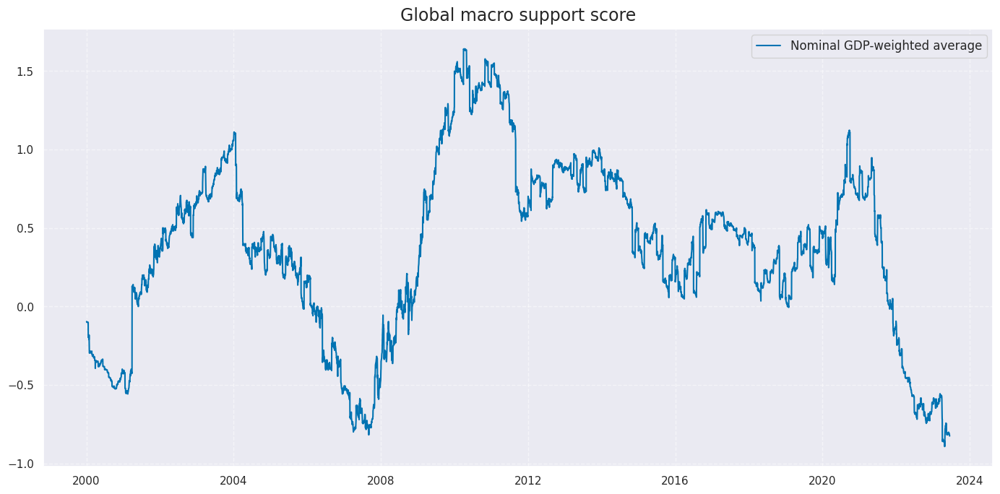

In [37]:
xcatx = ["MACRO_CZS_ALL"]
cidx = ["GLB"]
sdate = "2000-01-01"


msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start=sdate,
    end="2023-06-16",
    size=(14, 7),
    title="Global macro support score",
    title_fontsize=17,
    xcat_labels=["Nominal GDP-weighted average"],
    label_adj=0.2,
)

## Equity return momentum and modification

### Standard trend

Here we take a standard equity trend indicator as the difference between 200-day and 50-day moving averages

In [38]:
fxrs = ["EQXR_NSA", "EQXR_VT10"]
cidx = cids_dmeq

calcs = []
for fxr in fxrs:
    calc = [
        f"{fxr}I = ( {fxr} ).cumsum()",
        f"{fxr}I_50DMA = {fxr}I.rolling(50).mean()",
        f"{fxr}I_200DMA = {fxr}I.rolling(200).mean()",
        f"{fxr}I_50v200DMA = {fxr}I_50DMA - {fxr}I_200DMA",
    ]
    calcs += calc

dfa = msp.panel_calculator(dfx, calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

eqtrends = ["EQXR_NSAI_50v200DMA", "EQXR_VT10I_50v200DMA"]

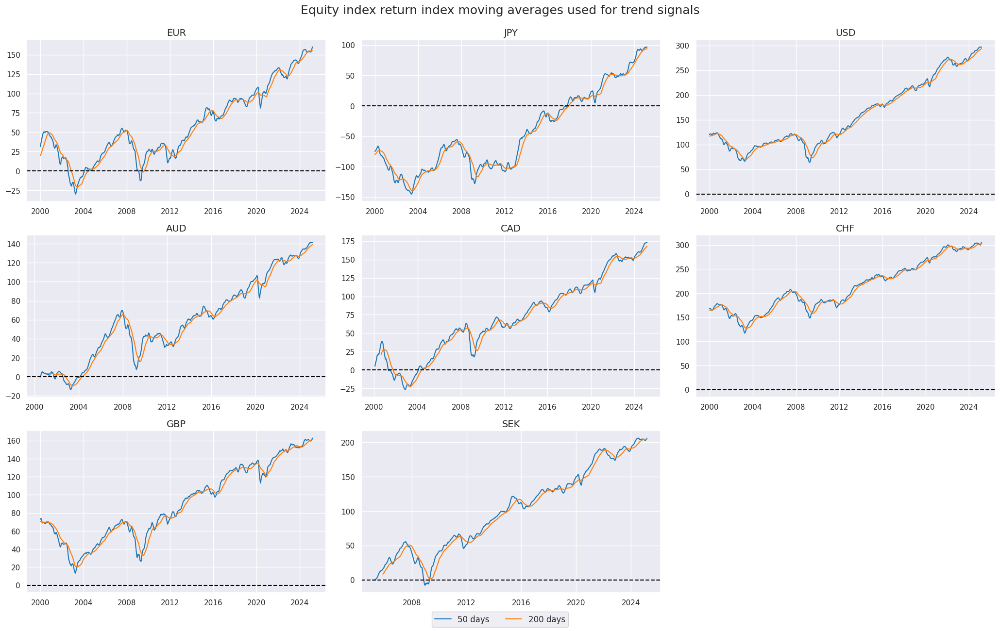

In [39]:
xcatx = ["EQXR_NSAI_50DMA", "EQXR_NSAI_200DMA"]
cidx = cids_dmeq
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    cumsum=False,
    start=sdate,
    same_y=False,
    size=(14, 8),
    all_xticks=True,
    title="Equity index return index moving averages used for trend signals",
    title_fontsize=18,
    xcat_labels=["50 days", "200 days"],
    label_adj=0.15,
)

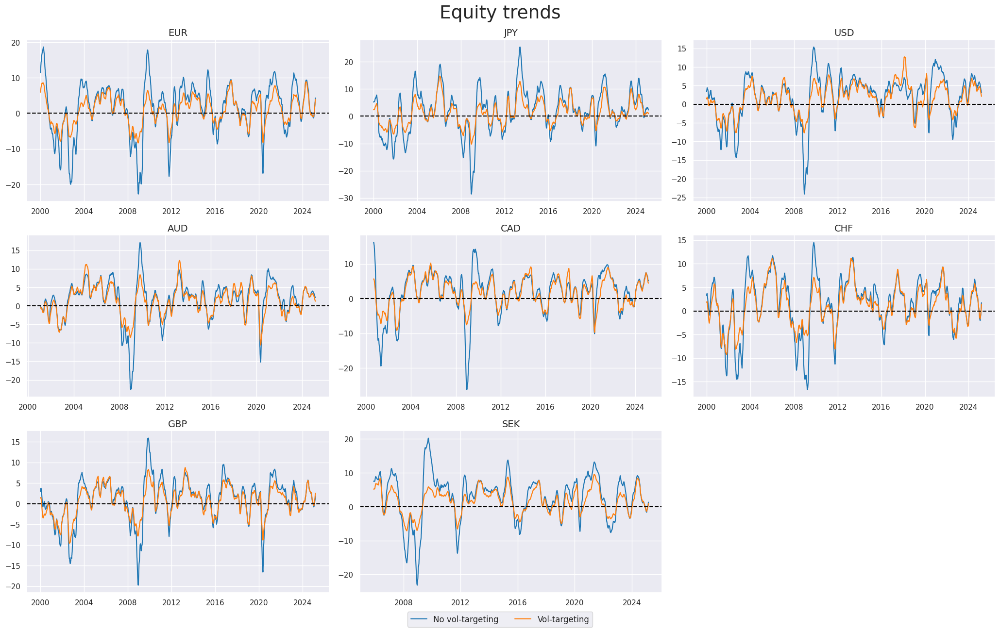

In [40]:
xcatx = eqtrends
cidx = cids_dmeq

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    cumsum=False,
    start=sdate,
    same_y=False,
    size=(14, 8),
    all_xticks=True,
    title_fontsize=27,
    title="Equity trends",
    xcat_labels=["No vol-targeting", "Vol-targeting"],
    label_adj=0.175,
)

### Modified trend

In preparation for trend modification, we z-score the trends and the modified macro signals.

In [41]:
xcatx = eqtrends + macro_czs
cidx = cids_dmeq

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=522,  # oos scaling after 2 years of panel data
        est_freq="m",
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="Z",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

eqtrendz = [tr + "Z" for tr in eqtrends]
macro_czsz = [mc + "Z" for mc in macro_czs]

Next, we apply a modification, allowing for adjustments to the strength of the trend signal based on the quantamental information captured by the external strength z-score. The trend remains the dominant signal, but we allow quantamental information to increase the trend signal by up to 100% and to reduce it by up to zero. However, quantamental information does not “flip” the signal. The modification coefficient ensures that the adjustment remains within [0,2] interval, hence preventing extreme flips or amplifications of the trend signal.

The linear modification coefficient applied to the trend is based on the external strength z-score. The application depends on the sign of the concurrent trend signal.

* If the trend signal is positive external strength it enhances it and external weakness reduces it. The modification coefficient uses a sigmoid function that translates the external strength score such that for a value of zero it is 1, for values of -1 and 1 it is 0.25 and 1.75 respectively and for its minimum and maximum of -3 and 3 it is 0 zero and 2 respectively.

* If the trend signal is negative the modification coefficient depends negatively on external strength but in the same way.

This can be expressed by the following equation:

\begin{equation}
\text{adtrend} = ((1 - \text{sign}(\text{trend}))  + \text{sign}(\text{trend}) * \text{coef}) * \text{trend}
\end{equation}

where
\begin{equation}
\text{coef}= \frac{2}{1 + e^{-2 * \text{strength}}}
\end{equation}

This means for a positive trend:

\begin{equation}
\text{adtrend} = \text{coef} * \text{trend}
\end{equation}

and for a negative trend:
\begin{equation}
\text{adtrend} = (2 - \text{coef}) * \text{trend}
\end{equation}

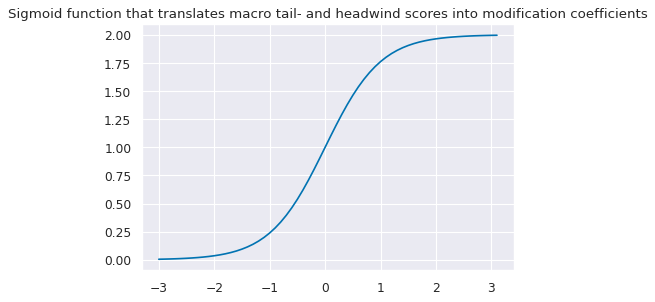

In [42]:
def sigmoid(x):
    return 2 / (1 + np.exp(-2 * x))


ar = np.arange(-3, 3.2, 0.1)
plt.figure(figsize=(6, 4), dpi=80)
plt.plot(ar, sigmoid(ar))
plt.title(
    "Sigmoid function that translates macro tail- and headwind scores into modification coefficients"
)
plt.show()

We first calculate the base modification coefficients for all external strength scores, as applicable for positive trend scores, and then apply it to the trend scores in dependence upon their signs.

In [43]:
macro_modz = ["MACRO_CZS_ALLZ", "LABSLACK_CZS_ZN", "XCPI_SFALL_CZS_ZN", "XEQCRR_CZS_ZN"]
calcs = []
for zd in macro_modz:
    calcs += [f"{zd}_C = ( {zd} ).applymap( lambda x: 2 / (1 + np.exp( - 2 * x)) ) "]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

coefs = list(dfa["xcat"].unique())

Here is a timeline of the coefficients for the composite indicator. The value for the coefficient is between 0 and 2, with values below 1 mean reduction of the original signal and values above 1 mean strengthening of the original signal.

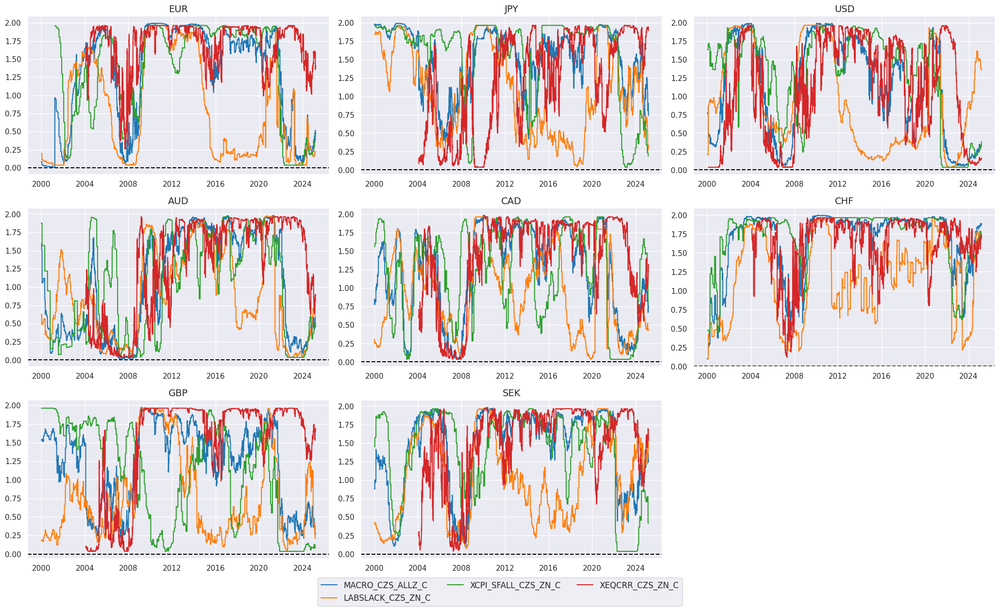

In [44]:
xcatx = coefs
cidx = cids_dmeq

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    cumsum=False,
    start=sdate,
    same_y=False,
    size=(14, 8),
    all_xticks=True,
    label_adj=0.2,
)

Calculation of the trend sign-contingent coefficient and adjusted trends is based on the below formula.

`((1 - sign(trend))  + sign(trend) * coef) * trend`

In [45]:
calcs = []
for tr in eqtrendz:
    for xs in macro_modz:
        trxs = tr.split("TREND")[0] + "m" + xs.split("_")[0]
        calcs += [f"{trxs}_C = (1 - np.sign( {tr} )) + np.sign( {tr} ) * {xs}_C"]
        calcs += [f"{trxs} = {trxs}_C * {tr}"]

dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids_dmeq)
dfx = msm.update_df(dfx, dfa)

eqtrendz_mod = [xc for xc in dfa["xcat"].unique() if not xc.endswith("_C")]

The below chart panel shows the time series of standard and modified trend signals. Naturally, modification never changes the sign of the signal and the direction of the market position. However, it does alter the relative size of the market risk taken. For example, the strong macro support for local equity markets in the 2010s magnified risk-taking in positive trends and reduced risk-taking in negative trends. Similarly, the adverse macro trends in some countries in the 2000s resulted in greater emphasis on short positions prior to the great financial crisis. 

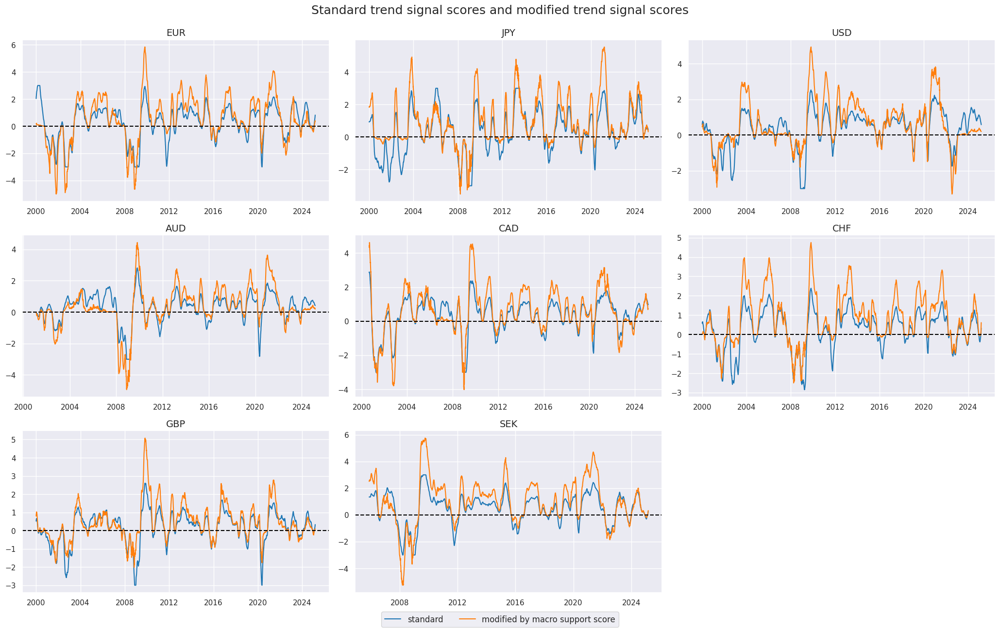

In [46]:
xcatx = ["EQXR_NSAI_50v200DMAZ", "EQXR_NSAI_50v200DMAZmMACRO"]
cidx = cids_dmeq
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=3,
    cumsum=False,
    start=sdate,
    same_y=False,
    size=(14, 8),
    all_xticks=True,
    title="Standard trend signal scores and modified trend signal scores",
    title_fontsize=18,
    xcat_labels=["standard", "modified by macro support score"],
    label_adj=0.12,
)

### Weighted global trends

We weight the trend signals by respective GDP share to create a composite equity trend signal, creating a global (with postfix `_GLB` signal)                                           

In [47]:
xcatx = eqtrendz + eqtrendz_mod
cidx = cids_dmeq

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.linear_composite(
        df=dfx,
        xcats=xc,
        cids=cidx,
        complete_xcats=False,
        weights="USDGDPWGT_SA_3YMA",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

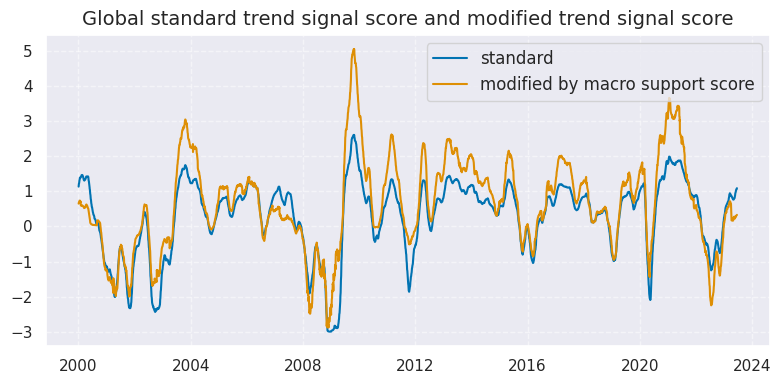

In [48]:
xcatx = ["EQXR_NSAI_50v200DMAZ", "EQXR_NSAI_50v200DMAZmMACRO"]
cidx = ["GLB"]
sdate = "2000-01-01"


msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start=sdate,
    end="2023-06-16",
    size=(8, 4),
    title="Global standard trend signal score and modified trend signal score",
    title_fontsize=14,
    xcat_labels=["standard", "modified by macro support score"],
    label_adj=0.12,
)

## Targets

As target we choose standard Equity index future returns [EQXR_NSA](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/Equity%20index%20future%20returns.php?highlight=eqxr_nsa)

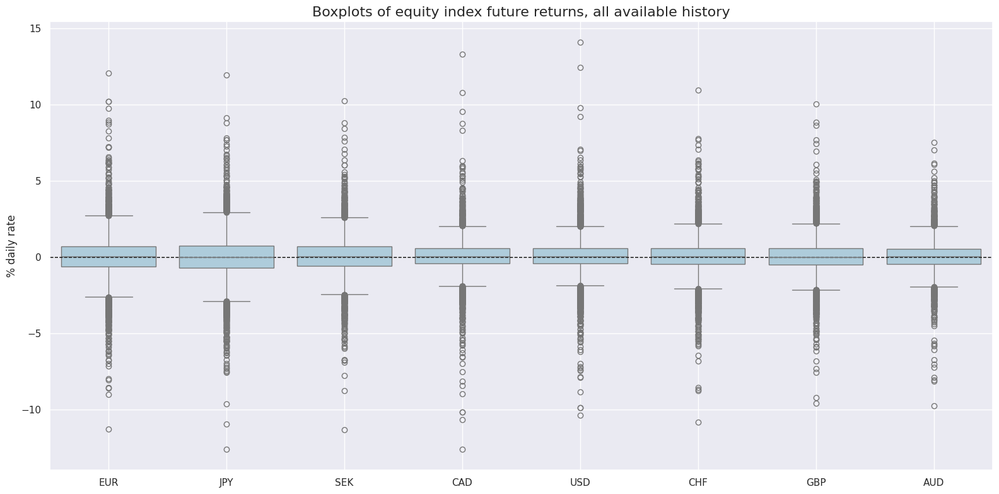

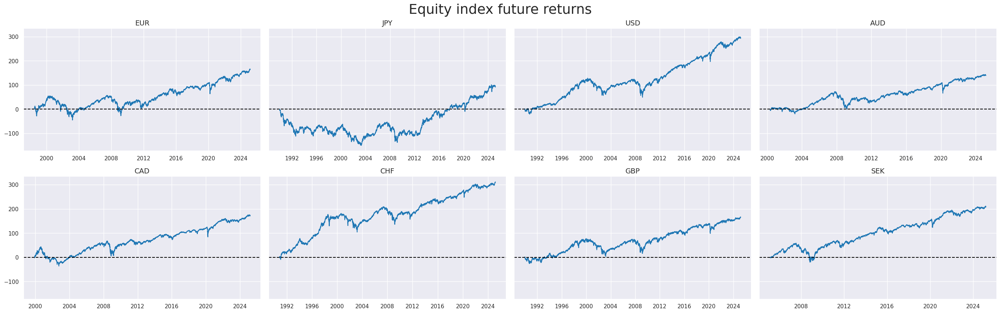

In [49]:
xcatx = ["EQXR_NSA"]
cidx = cids_dmeq
sdate = "1990-01-01"

msp.view_ranges(
    dfx,
    cids=cidx,
    xcats=xcatx,
    kind="box",
    sort_cids_by="std",
    ylab="% daily rate",
    start=sdate,
    title="Boxplots of equity index future returns, all available history",
)

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=True,
    start=sdate,
    same_y=True,
    size=(12, 12),
    all_xticks=True,
    title="Equity index future returns",
    title_fontsize=27,
    legend_fontsize=17,
)

We create a "Global equity index future return" as GDP share weighted average of cross-sectional trend signal scores" by using the GDP-share weights of the countries in the sample. 

In [50]:
xcatx = ["EQXR_NSA"]
cidx = cids_dmeq

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.linear_composite(
        df=dfx,
        xcats=xc,
        cids=cidx,
        complete_xcats=False,
        weights="USDGDPWGT_SA_3YMA",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

# Value checks

## Simple trend and modifiers

### Specs and panel test

Using standard 50/200 equity trend as the main signal, the next chart plots the relationship between the main signal and subsequent equity index future return

In [51]:
eqtrendz_nsa = [et for et in eqtrendz + eqtrendz_mod if "NSA" in et]
sigs = eqtrendz_nsa
ms = eqtrendz_nsa[0]
oths = list(set(sigs) - set([ms]))  # other signals

targ = "EQXR_NSA"
cidx = cids_dmeq + ["GLB"]
start = "1990-01-01"

dict_es = {
    "sig": ms,
    "rivs": oths,
    "targ": targ,
    "cidx": cidx,
    "start": start,
    "black": None,
    "srr": None,
    "pnls": None,
}

The scatterplot below shows a highly significant positive correlation of 0.07 between the unmodified trend signal and subsequent returns

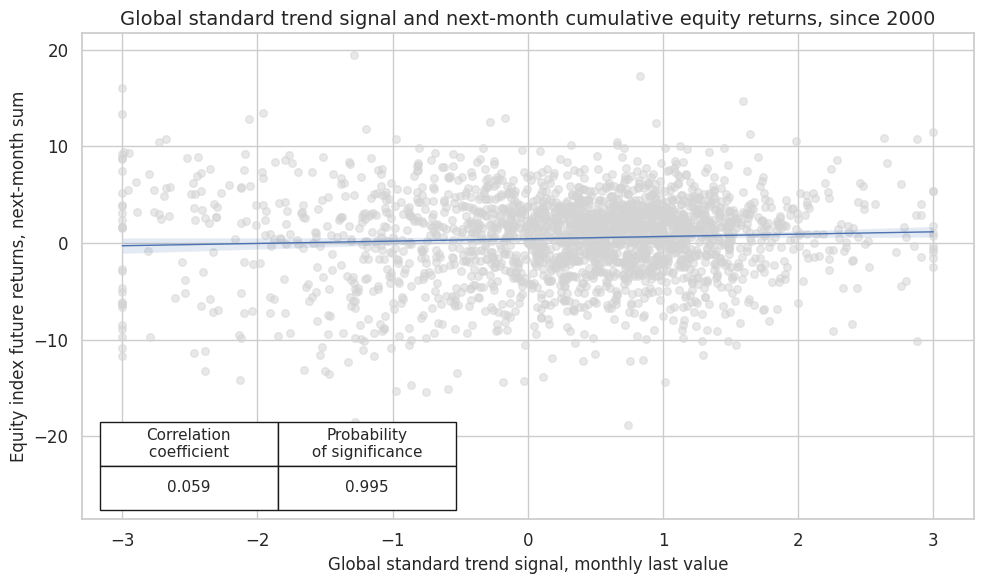

In [52]:
dix = dict_es
start = "2000-01-01"
cidx = cids_dmeq

sig = dix["sig"]
targ = dix["targ"]
blax = dix["black"]

crx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
    blacklist=blax,
)
crx.reg_scatter(
    labels=False,
    coef_box="lower left",
    xlab="Global standard trend signal, monthly last value",
    ylab="Equity index future returns, next-month sum",
    title="Global standard trend signal and next-month cumulative equity returns, since 2000",
    size=(10, 6),
)

Using the 50/200 equity trend (modified by macro support) as the main signal, the next chart plots the relationship between this modified main signal and subsequent equity index future return. The correlation coefficient has increased. The correlation remained highly significant.

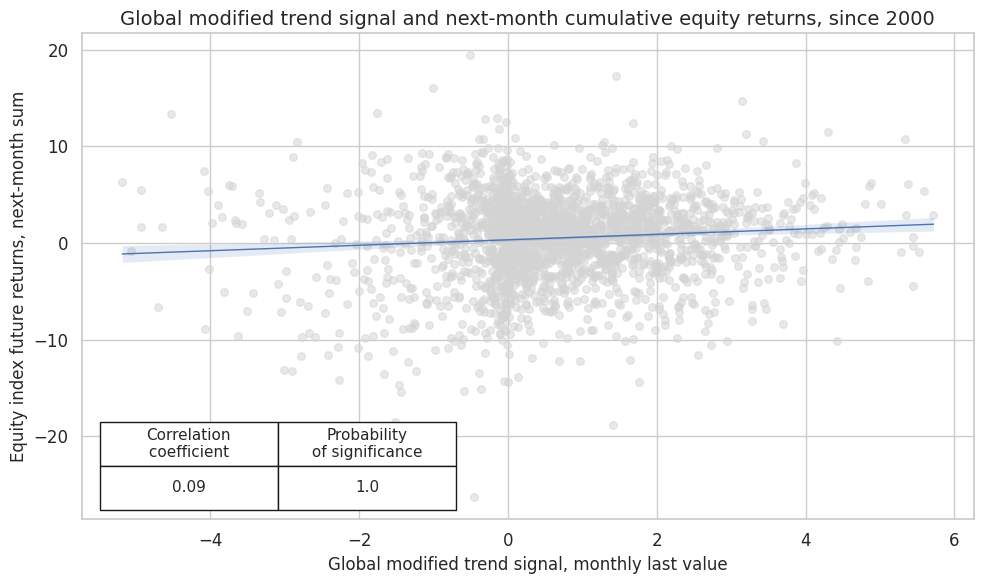

In [53]:
dix = dict_es
sig = "EQXR_NSAI_50v200DMAZmMACRO"
start = "2000-01-01"
cidx = cids_dmeq

targ = dix["targ"]
blax = dix["black"]

crx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
    blacklist=blax,
)
crx.reg_scatter(
    labels=False,
    coef_box="lower left",
    xlab="Global modified trend signal, monthly last value",
    ylab="Equity index future returns, next-month sum",
    title="Global modified trend signal and next-month cumulative equity returns, since 2000",
    size=(10, 6),
)

Performing similar correlation analysis for the global standard trend scores at a monthly frequency shows that the relationship has been positively and significantly related to subsequent global monthly equity index future returns. 

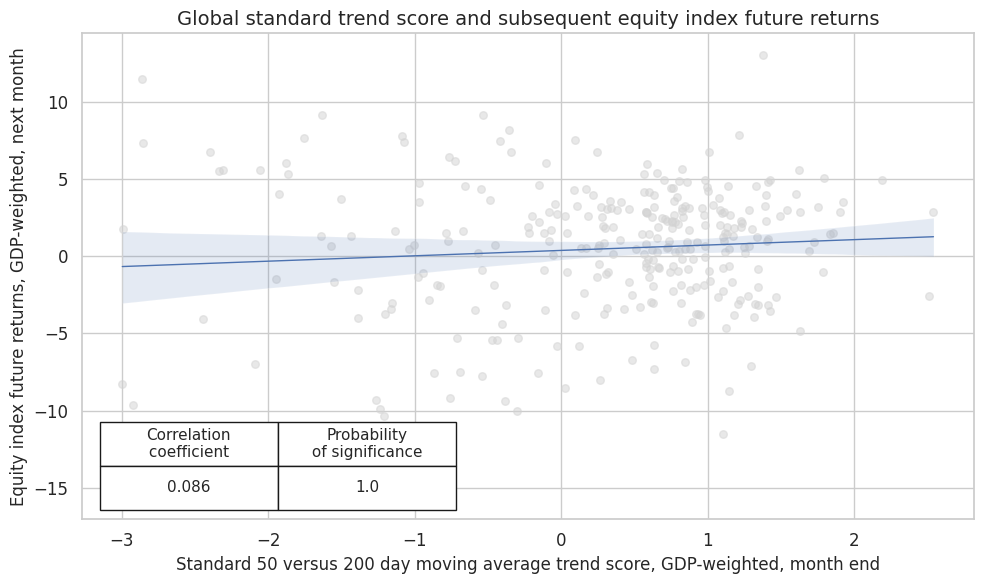

In [54]:
dix = dict_es
sig = "EQXR_NSAI_50v200DMAZ"
start = "2000-01-01"
cidx = ["GLB"]

targ = dix["targ"]
blax = dix["black"]

crx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
    blacklist=blax,
)
crx.reg_scatter(
    labels=False,
    coef_box="lower left",
    title="Global standard trend score and subsequent equity index future returns",
    xlab="Standard 50 versus 200 day moving average trend score, GDP-weighted, month end",
    ylab="Equity index future returns, GDP-weighted, next month",
    size=(10, 6),
    prob_est="map",
)

Modifying the trend signals by macro support scores enhances correlation and significance.

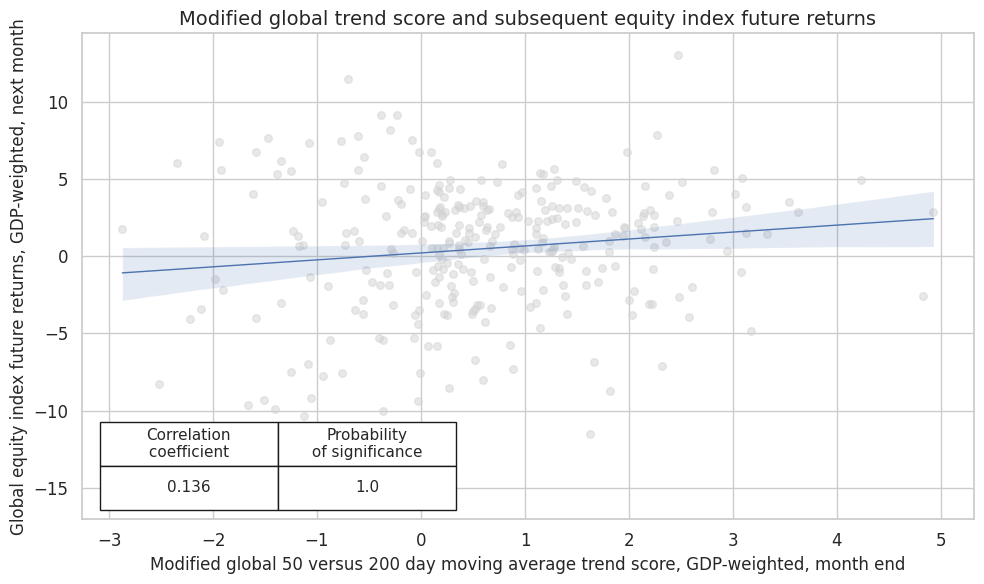

In [55]:
dix = dict_es
sig = "EQXR_NSAI_50v200DMAZmMACRO"
cidx = ["GLB"]
start = "2000-01-01"

targ = dix["targ"]
blax = dix["black"]

crx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
    blacklist=blax,
)
crx.reg_scatter(
    labels=False,
    coef_box="lower left",
    title="Modified global trend score and subsequent equity index future returns",
    xlab="Modified global 50 versus 200 day moving average trend score, GDP-weighted, month end",
    ylab="Global equity index future returns, GDP-weighted, next month",
    size=(10, 6),
    prob_est="map",
)

### Accuracy and correlation check

We calculate standard accuracy metrics for standard and modified signals globally

In [56]:
dix = dict_es
start = "2000-01-01"
cidx = ["GLB"]

sig = dix["sig"]
rivs = dix["rivs"]
targ = dix["targ"]
blax = dix["black"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=[sig] + rivs,
    rets=targ,
    freqs="M",
    start=start,
    blacklist=blax,
)

dix["srr"] = srr

In [57]:
dix = dict_es
srrx = dix["srr"]
display(srrx.signals_table().sort_index().astype("float").round(3))

accuracy  \
Return   Signal                        Frequency Aggregation             
EQXR_NSA EQXR_NSAI_50v200DMAZ          M         last            0.589   
         EQXR_NSAI_50v200DMAZmLABSLACK M         last            0.593   
         EQXR_NSAI_50v200DMAZmMACRO    M         last            0.613   
         EQXR_NSAI_50v200DMAZmXCPI     M         last            0.599   
         EQXR_NSAI_50v200DMAZmXEQCRR   M         last            0.606   

                                                              bal_accuracy  \
Return   Signal                        Frequency Aggregation                 
EQXR_NSA EQXR_NSAI_50v200DMAZ          M         last                0.548   
         EQXR_NSAI_50v200DMAZmLABSLACK M         last                0.554   
         EQXR_NSAI_50v200DMAZmMACRO    M         last                0.572   
         EQXR_NSAI_50v200DMAZmXCPI     M         last                0.555   
         EQXR_NSAI_50v200DMAZmXEQCRR   M         last                0.563   

                                                              pos_sigr  \
Return   Signal                        Frequency Aggregation             
EQXR_NSA EQXR_NSAI_50v200DMAZ          M         last            0.702   
         EQXR_NSAI_50v200DMAZmLABSLACK M         last            0.692   
         EQXR_NSAI_50v200DMAZmMACRO    M         last            0.725   
         EQXR_NSAI_50v200DMAZmXCPI     M         last            0.725   
         EQXR_NSAI_50v200DMAZmXEQCRR   M         last            0.732   

                                                              pos_retr  \
Return   Signal                        Frequency Aggregation             
EQXR_NSA EQXR_NSAI_50v200DMAZ          M         last            0.623   
         EQXR_NSAI_50v200DMAZmLABSLACK M         last            0.623   
         EQXR_NSAI_50v200DMAZmMACRO    M         last            0.623   
         EQXR_NSAI_50v200DMAZmXCPI     M         last            0.623   
         EQXR_NSAI_50v200DMAZmXEQCRR   M         last            0.623   

                                                              pos_prec  \
Return   Signal                        Frequency Aggregation             
EQXR_NSA EQXR_NSAI_50v200DMAZ          M         last            0.651   
         EQXR_NSAI_50v200DMAZmLABSLACK M         last            0.656   
         EQXR_NSAI_50v200DMAZmMACRO    M         last            0.662   
         EQXR_NSAI_50v200DMAZmXCPI     M         last            0.653   
         EQXR_NSAI_50v200DMAZmXEQCRR   M         last            0.656   

                                                              neg_prec  \
Return   Signal                        Frequency Aggregation             
EQXR_NSA EQXR_NSAI_50v200DMAZ          M         last            0.444   
         EQXR_NSAI_50v200DMAZmLABSLACK M         last            0.452   
         EQXR_NSAI_50v200DMAZmMACRO    M         last            0.482   
         EQXR_NSAI_50v200DMAZmXCPI     M         last            0.458   
         EQXR_NSAI_50v200DMAZmXEQCRR   M         last            0.469   

                                                              pearson  \
Return   Signal                        Frequency Aggregation            
EQXR_NSA EQXR_NSAI_50v200DMAZ          M         last           0.086   
         EQXR_NSAI_50v200DMAZmLABSLACK M         last           0.113   
         EQXR_NSAI_50v200DMAZmMACRO    M         last           0.136   
         EQXR_NSAI_50v200DMAZmXCPI     M         last           0.131   
         EQXR_NSAI_50v200DMAZmXEQCRR   M         last           0.125   

                                                              pearson_pval  \
Return   Signal                        Frequency Aggregation                 
EQXR_NSA EQXR_NSAI_50v200DMAZ          M         last                0.135   
         EQXR_NSAI_50v200DMAZmLABSLACK M         last                0.051   
         EQXR_NSAI_50v200DMAZmMACRO    M         last                0.018   
         EQXR_NSAI

### Naive PnL DM

We calculate naïve PnLs based on standard rules used in Macrosynergy posts. Positions are taken based on standard and modified trend scores across the 8 developed equity market index futures. Positions are rebalanced monthly with a one-day slippage added for trading. Transaction costs are disregarded because they depend heavily on the value of assets under strategy management. The long-term volatility of the PnL for positions across all currency areas has been set to 10% annualized for ease of presentation.
The main finding is that macro-modification roughly has roughly doubled risk-adjusted returns of a directional equity trend-following strategy since 2000. The long-term naïve Sharpe ratio of the standard trend-following strategy has been 0.27. The outperformance developed through four major episodes since 2004.


In [58]:
dix = dict_es
start = "2000-01-01"

sigx = [dix["sig"]] + dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    blacklist=blax,
    bms=["USD_EQXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        thresh=3,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

dix["pnls"] = naive_pnl

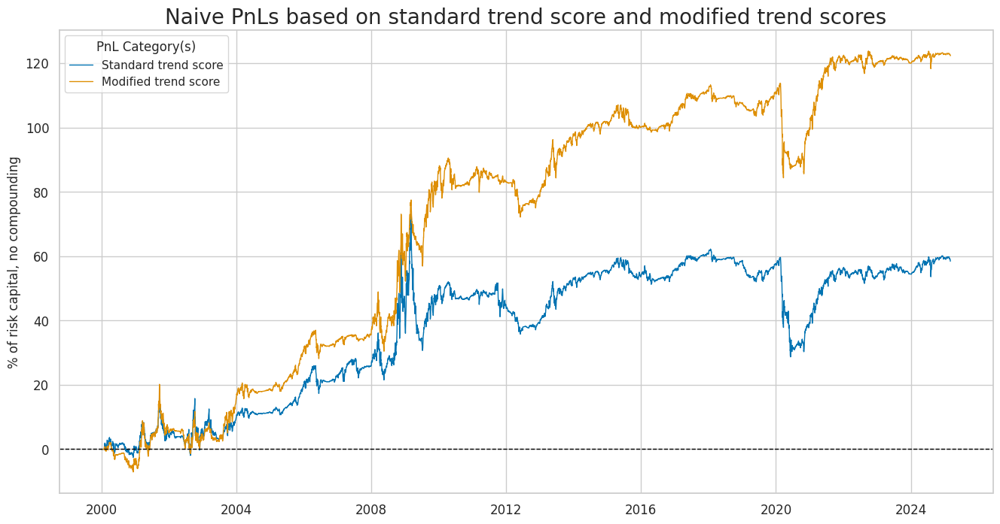

In [59]:
dix = dict_es
start = "2000-01-01"

cidx = dix["cidx"]

sigx = eqtrendz_nsa[:2]
naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx]

dict_labels={"EQXR_NSAI_50v200DMAZ_PZN": "Standard trend score",
             "EQXR_NSAI_50v200DMAZmMACRO_PZN": "Modified trend score"}

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Naive PnLs based on standard trend score and modified trend scores",
    xcat_labels=dict_labels,
    figsize=(16, 8),
)

The outperformance of the modified trend signal is not very sensitive to the choice of the modifier. All three constituents of the macro support score would have enhanced trend following turns, albeit individually not quite as much as the composite score. 

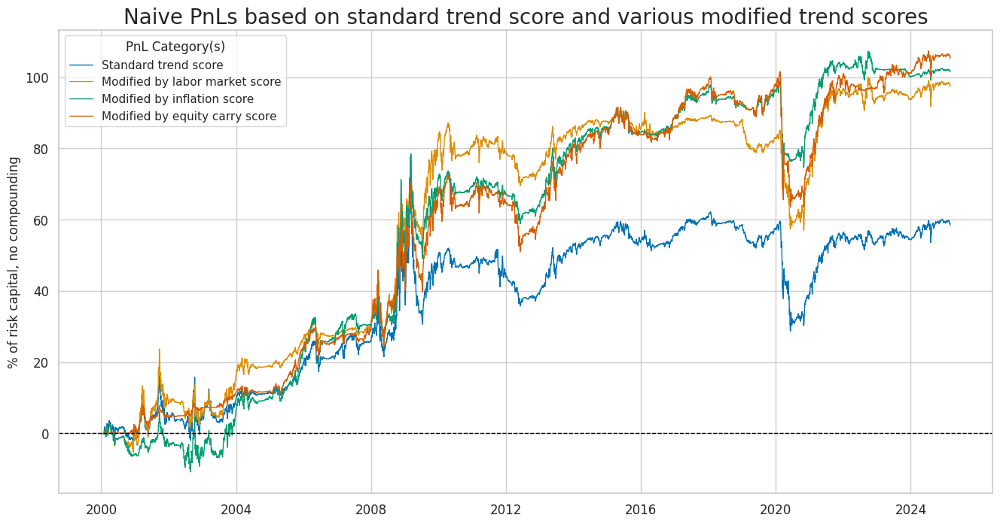

In [60]:
dix = dict_es
start = "2000-01-01"

cidx = dix["cidx"]

sigx = eqtrendz_nsa[:1] + eqtrendz_nsa[2:]
naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx]

dict_labels = {
        "EQXR_NSAI_50v200DMAZ_PZN": "Standard trend score",
        "EQXR_NSAI_50v200DMAZmLABSLACK_PZN": "Modified by labor market score",
        "EQXR_NSAI_50v200DMAZmXCPI_PZN": "Modified by inflation score",
        "EQXR_NSAI_50v200DMAZmXEQCRR_PZN": "Modified by equity carry score"
}

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    figsize=(16, 8),
    title="Naive PnLs based on standard trend score and various modified trend scores",
    xcat_labels=dict_labels
)

Below is the standard performance metrics for the main modified signal and its constituents 

In [61]:
dix = dict_es

start = dix["start"]
sigx = [dix["sig"]] + dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)
display(df_eval.transpose())

,Return %,St. Dev. %,Sharpe Ratio,Sortino Ratio,Max 21-Day Draw %,Max 6-Month Draw %,Peak to Trough Draw %,Top 5% Monthly PnL Share,USD_EQXR_NSA correl,Traded Months
xcat,,,,,,,,,,
EQXR_NSAI_50v200DMAZ_PZN,2.320562,10.0,0.232056,0.321385,-25.413723,-32.469588,-44.333665,1.683824,-0.180235,303
EQXR_NSAI_50v200DMAZmXEQCRR_PZN,4.195288,10.0,0.419529,0.577003,-34.830065,-34.823922,-38.022,0.948359,0.059721,303
EQXR_NSAI_50v200DMAZmMACRO_PZN,4.860052,10.0,0.486005,0.683131,-28.514437,-25.032997,-29.384686,0.930369,-0.025605,303
EQXR_NSAI_50v200DMAZmLABSLACK_PZN,3.87021,10.0,0.387021,0.547437,-17.553124,-25.209139,-33.22804,1.222176,-0.134153,303
EQXR_NSAI_50v200DMAZmXCPI_PZN,4.035442,10.0,0.403544,0.569336,-27.430278,-22.954912,-29.457033,1.034296,-0.076461,303


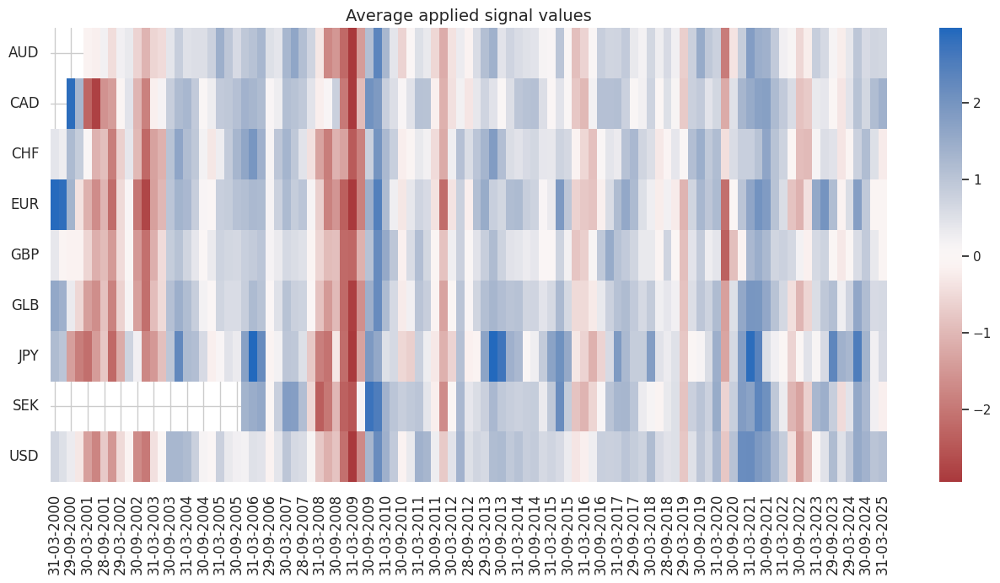

In [62]:
dix = dict_es

start = dix["start"]
sig = dix["sig"]
naive_pnl = dix["pnls"]

naive_pnl.signal_heatmap(pnl_name=sig + "_PZN", freq="q", start=start, figsize=(16, 7))